<a href="https://colab.research.google.com/github/RYUKxAYU/Cognify-Technology-/blob/main/assignment_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# Load the dataset
file_path = "/content/Dataset .csv"
df = pd.read_csv(file_path)

df.head(), df.columns


(   Restaurant ID         Restaurant Name  Country Code              City  \
 0        6317637        Le Petit Souffle           162       Makati City   
 1        6304287        Izakaya Kikufuji           162       Makati City   
 2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
 3        6318506                    Ooma           162  Mandaluyong City   
 4        6314302             Sambo Kojin           162  Mandaluyong City   
 
                                              Address  \
 0  Third Floor, Century City Mall, Kalayaan Avenu...   
 1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
 2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
 3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
 4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   
 
                                      Locality  \
 0   Century City Mall, Poblacion, Makati City   
 1  Little Tokyo, Legaspi Village, Makati City   
 2  Edsa Shangri-La, Ortigas, Mandaluyong 

<ipython-input-4-b47d463e5f7d>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=locality_counts.values, y=locality_counts.index, palette='viridis')


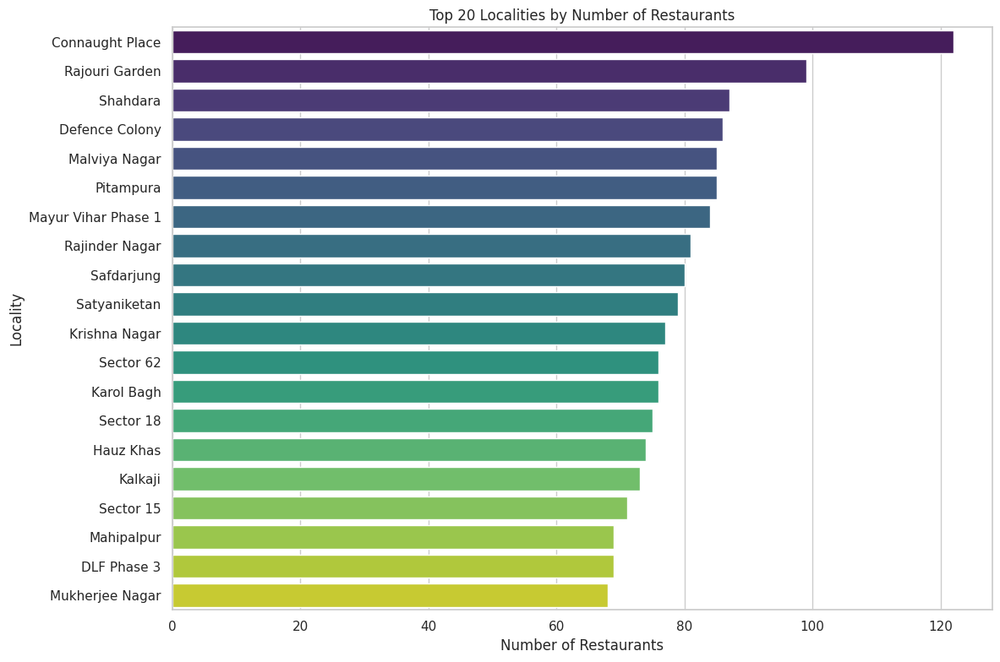

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

locality_counts = df['Locality'].value_counts().head(20)  # top 20 for better visualization

# Plot number of restaurants by locality
plt.figure(figsize=(12, 8))
sns.barplot(x=locality_counts.values, y=locality_counts.index, palette='viridis')
plt.title('Top 20 Localities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Locality')
plt.tight_layout()
plt.show()


<ipython-input-5-17f3927a705d>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=locality_stats['Aggregate rating'], y=locality_stats.index, palette='coolwarm')


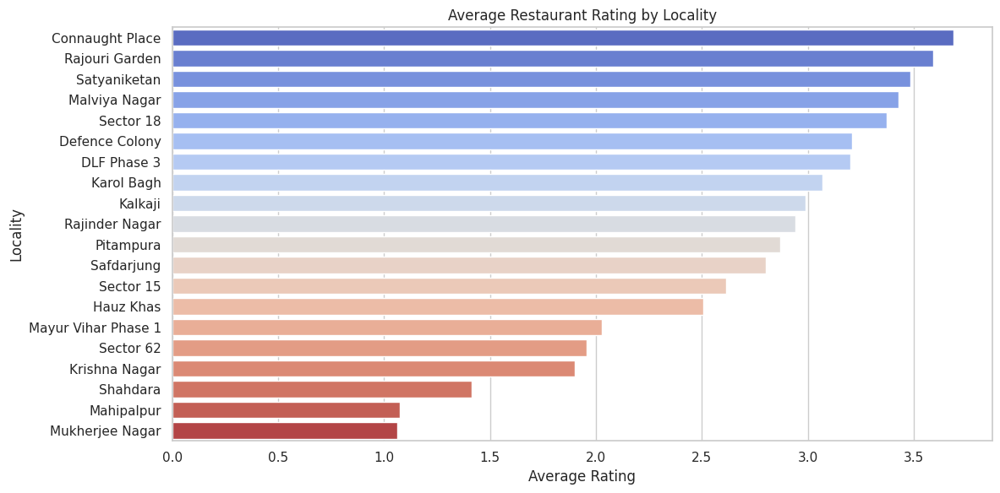

<ipython-input-5-17f3927a705d>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=locality_stats['Price range'], y=locality_stats.index, palette='mako')


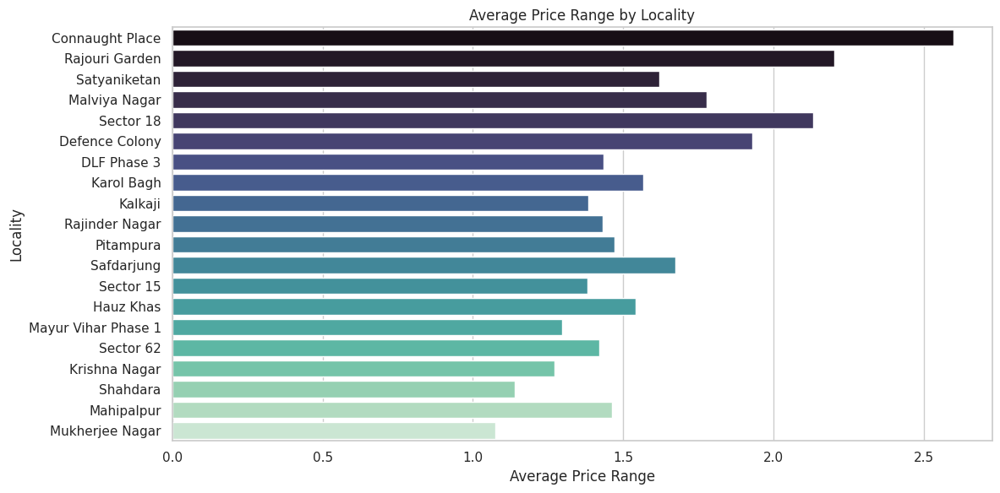

In [ ]:
# Filter data to include only top 20 localities
top_localities = locality_counts.index
df_top_localities = df[df['Locality'].isin(top_localities)]

locality_stats = df_top_localities.groupby('Locality')[['Aggregate rating', 'Price range']].mean().sort_values(by='Aggregate rating', ascending=False)

# Plot average rating
plt.figure(figsize=(12, 6))
sns.barplot(x=locality_stats['Aggregate rating'], y=locality_stats.index, palette='coolwarm')
plt.title('Average Restaurant Rating by Locality')
plt.xlabel('Average Rating')
plt.ylabel('Locality')
plt.tight_layout()
plt.show()

# Plot average price range
plt.figure(figsize=(12, 6))
sns.barplot(x=locality_stats['Price range'], y=locality_stats.index, palette='mako')
plt.title('Average Price Range by Locality')
plt.xlabel('Average Price Range')
plt.ylabel('Locality')
plt.tight_layout()
plt.show()


<ipython-input-6-ab33e1de31f1>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Count', y='Cuisine', data=cuisine_df, palette='Set2')


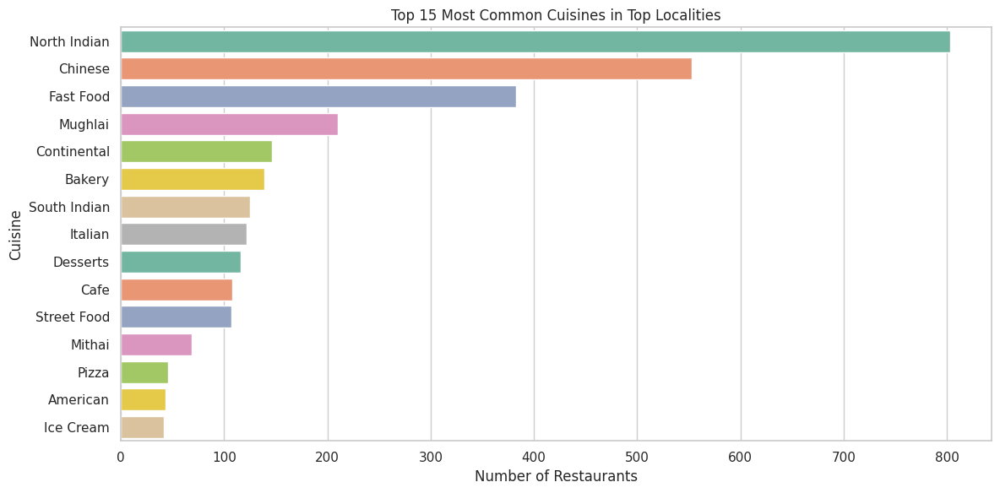

In [ ]:
from collections import Counter

# Get cuisines for top localities
cuisine_series = df_top_localities['Cuisines'].dropna().str.split(', ')

# Flatten the list of all cuisines
all_cuisines = [cuisine for sublist in cuisine_series for cuisine in sublist]

# Count the most common cuisines
cuisine_counts = Counter(all_cuisines).most_common(15)

cuisine_df = pd.DataFrame(cuisine_counts, columns=['Cuisine', 'Count'])
# Plot the top cuisines
plt.figure(figsize=(12, 6))
sns.barplot(x='Count', y='Cuisine', data=cuisine_df, palette='Set2')
plt.title('Top 15 Most Common Cuisines in Top Localities')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cuisine')
plt.tight_layout()
plt.show()


In [ ]:
import folium
from folium.plugins import MarkerCluster
#Map Visualization
def plot_restaurant_map(df):
#map centered on mean coordinates
    map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
    restaurant_map = folium.Map(location=map_center, zoom_start=2)

#marker cluster
    marker_cluster = MarkerCluster().add_to(restaurant_map)

#markers for each restaurant
    for _, row in df.iterrows():
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"{row['Restaurant Name']} ({row['Locality']}): {row['Aggregate rating']}",
            tooltip=row['Restaurant Name']
        ).add_to(marker_cluster)

#Save map to HTML
    map_file = '/content/restaurant_map.html'
    restaurant_map.save(map_file)
    print(f"Map saved to {map_file}. Open in browser or download from Colab.")
    return restaurant_map

print("\nStep 4: Generating Map")
restaurant_map = plot_restaurant_map(df)
display(restaurant_map)


Step 4: Generating Map
Map saved to /content/restaurant_map.html. Open in browser or download from Colab.


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import folium
# from folium.plugins import MarkerCluster
# from collections import Counter
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.preprocessing import LabelEncoder
# from io import StringIO

# # Set visualization style
# sns.set(style="whitegrid")

# # Step 1: Load and preprocess the dataset
# # For local file in Colab, replace with: df = pd.read_csv('/content/Dataset.csv')
# df = pd.read_csv('/content/Dataset .csv')

# # Handle missing values and data types
# df['Cuisines'] = df['Cuisines'].fillna('Unknown').astype(str)  # Ensure Cuisines is string
# df['Latitude'] = pd.to_numeric(df['Latitude'], errors='coerce')
# df['Longitude'] = pd.to_numeric(df['Longitude'], errors='coerce')
# df = df.dropna(subset=['Latitude', 'Longitude', 'Aggregate rating', 'Price range'])

# # Step 2: Group by Locality and count restaurants
# print("Step 1: Restaurant Concentration by Locality")
# locality_counts = df['Locality'].value_counts().head(20)
# print(locality_counts)

# # Plot number of restaurants by locality
# plt.figure(figsize=(12, 8))
# sns.barplot(x=locality_counts.values, y=locality_counts.index, palette='viridis')
# plt.title('Top 20 Localities by Number of Restaurants')
# plt.xlabel('Number of Restaurants')
# plt.ylabel('Locality')
# plt.tight_layout()
# plt.show()

# # Step 3: Statistics by Locality
# # Filter data for top 20 localities
# top_localities = locality_counts.index
# df_top_localities = df[df['Locality'].isin(top_localities)]

# # Calculate average rating and price range
# locality_stats = df_top_localities.groupby('Locality')[['Aggregate rating', 'Price range']].mean().sort_values(by='Aggregate rating', ascending=False)
# print("\nStep 2: Statistics by Locality")
# print(locality_stats)

# # Plot average rating
# plt.figure(figsize=(12, 6))
# sns.barplot(x=locality_stats['Aggregate rating'], y=locality_stats.index, palette='coolwarm')
# plt.title('Average Restaurant Rating by Locality')
# plt.xlabel('Average Rating')
# plt.ylabel('Locality')
# plt.tight_layout()
# plt.show()

# # Plot average price range
# plt.figure(figsize=(12, 6))
# sns.barplot(x=locality_stats['Price range'], y=locality_stats.index, palette='mako')
# plt.title('Average Price Range by Locality')
# plt.xlabel('Average Price Range')
# plt.ylabel('Locality')
# plt.tight_layout()
# plt.show()

# # Cuisine analysis
# cuisine_series = df_top_localities['Cuisines'].dropna().str.split(', ')
# all_cuisines = [cuisine for sublist in cuisine_series for cuisine in sublist]
# cuisine_counts = Counter(all_cuisines).most_common(15)
# cuisine_df = pd.DataFrame(cuisine_counts, columns=['Cuisine', 'Count'])

# # Plot top cuisines
# plt.figure(figsize=(12, 6))
# sns.barplot(x='Count', y='Cuisine', data=cuisine_df, palette='Set2')
# plt.title('Top 15 Most Common Cuisines in Top Localities')
# plt.xlabel('Number of Restaurants')
# plt.ylabel('Cuisine')
# plt.tight_layout()
# plt.show()

# # Step 4: Map Visualization
# print("\nStep 4: Generating Map")
# center_lat = df['Latitude'].mean()
# center_lon = df['Longitude'].mean()
# restaurant_map = folium.Map(location=[center_lat, center_lon], zoom_start=2)
# marker_cluster = MarkerCluster().add_to(restaurant_map)

# for idx, row in df.iterrows():
#     if pd.notnull(row['Latitude']) and pd.notnull(row['Longitude']):
#         folium.Marker(
#             location=[row['Latitude'], row['Longitude']],
#             popup=f"{row['Restaurant Name']}<br>{row['Locality']}<br>Rating: {row['Aggregate rating']}",
#             icon=folium.Icon(color='blue' if row['Aggregate rating'] >= 4 else 'red')
#         ).add_to(marker_cluster)

# # Save and display map
# restaurant_map.save('/content/restaurant_map.html')
# print("Map saved to /content/restaurant_map.html. Open in browser or download from Colab.")
# from IPython.display import display
# display(restaurant_map)

# # Step 5: Train a Model
# print("\nStep 5: Training Model")
# # Prepare features for model
# df_model = df[['Latitude', 'Longitude', 'Locality', 'Cuisines', 'Price range', 'Aggregate rating']].copy()

# # Ensure Cuisines is string and handle invalid entries
# df_model['Cuisines'] = df_model['Cuisines'].fillna('Unknown').astype(str)
# df_model['Cuisines'] = df_model['Cuisines'].apply(
#     lambda x: x.split(', ')[0].strip() if (isinstance(x, str) and x != 'Unknown' and ', ' in x) else x
# )

# # Encode categorical variables
# le_locality = LabelEncoder()
# le_cuisines = LabelEncoder()
# le_price = LabelEncoder()

# df_model['locality_encoded'] = le_locality.fit_transform(df_model['Locality'])
# df_model['cuisines_encoded'] = le_cuisines.fit_transform(df_model['Cuisines'])
# df_model['price_range_encoded'] = le_price.fit_transform(df_model['Price range'])

# # Features and target
# X = df_model[['Latitude', 'Longitude', 'locality_encoded', 'cuisines_encoded', 'price_range_encoded']]
# y = df_model['Aggregate rating']

# # Split data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Train Random Forest model
# model = RandomForestRegressor(n_estimators=100, random_state=42)
# model.fit(X_train, y_train)

# # Evaluate model
# y_pred = model.predict(X_test)
# mse = ((y_pred - y_test) ** 2).mean()
# print(f"Model Performance: Mean Squared Error = {mse:.4f}")

# # Feature importance
# feature_importance = pd.DataFrame({
#     'feature': X.columns,
#     'importance': model.feature_importances_
# }).sort_values(by='importance', ascending=False)
# print("Feature Importance:")
# print(feature_importance)

# # Plot feature importance
# plt.figure(figsize=(10, 6))
# sns.barplot(x='importance', y='feature', data=feature_importance, palette='viridis')
# plt.title('Feature Importance in Predicting Restaurant Ratings')
# plt.xlabel('Importance')
# plt.ylabel('Feature')
# plt.tight_layout()
# plt.show()

# # Step 6: Insights and Patterns
# print("\nStep 6: Insights and Patterns")
# most_common_locality = locality_counts.index[0]
# highest_rated_locality = locality_stats.index[0]
# most_common_cuisine = cuisine_df['Cuisine'].iloc[0]
# highest_price_locality = locality_stats.sort_values(by='Price range', ascending=False).index[0]

# # Count localities where the most common cuisine appears
# cuisine_locality_count = len(df[df['Cuisines'].str.contains(most_common_cuisine, na=False)]['Locality'].unique())

# print(f"Locality with highest restaurant concentration: {most_common_locality} ({locality_counts.iloc[0]} restaurants)")
# print(f"Locality with highest average rating: {highest_rated_locality} ({locality_stats['Aggregate rating'].iloc[0]:.2f})")
# print(f"Most widespread cuisine: {most_common_cuisine} (available in {cuisine_locality_count} localities)")
# print(f"Locality with highest average price range: {highest_price_locality} ({locality_stats['Price range'].loc[highest_price_locality]:.2f})")